In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import os
import matplotlib.pyplot as plt
import sys
import requests
import seaborn as sns
from starcat import starCAT

In [2]:
# Initialize directory to download example data to
data_dir = './Example_Data'

if not os.path.exists(data_dir):
    os.mkdir(data_dir)

datafn = os.path.join(data_dir, 'example_data.h5ad')

# Download example data

In [3]:
def download_file_from_google_drive(file_id, destination):
    URL = "https://drive.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : file_id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : file_id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk:  # filter out keep-alive new chunks
                f.write(chunk)

In [4]:
# Uncomment to download example data for the example
download_file_from_google_drive("1Rr3DWumYaFDOiPpf8sAFw0X2BkJlZNFP", datafn)

# Run starCAT with the TCAT.V1 reference

This same pipeline can be run from the command line using the following sample code:
```python starCAT.py --reference "TCAT.V1" --counts $counts --output-dir $output_dir --name $name```

In [5]:
tcat = starCAT(reference='TCAT.V1', cachedir='./cache')

Using reference from starCAT database
Making empty cache directory "./cache"
Caching reference to ./cache/TCAT.V1


In [6]:
# View first 5 GEPs and 5 genes for default reference spectra (genes x programs)
print(tcat.ref_name)
display(tcat.ref.iloc[:5, :5])

TCAT.V1


,A1BG,AARD,AARSD1,ABCA1,ABCB1
CellCycle-G2M,2.032614,22.965553,17.423538,3.478179,2.297279
Translation,35.445282,0.000000,9.245893,0.477994,0.000000
HLA,18.192997,14.632670,2.686475,3.937182,0.000000
ISG,0.436212,0.000000,18.078197,17.354506,0.000000
Mito,10.293049,0.000000,52.669895,14.615502,3.341488


In [7]:
# This is the information for the scores that will be calculated byt starCAT with the current reference
tcat.score_data

{'scores': {'continuous': [{'name': 'ASA',
    'normalization': 'normalized',
    'columns': ['TIMD4/TIM3', 'ICOS/CD38', 'CTLA4/CD38', 'OX40/EBI3']},
   {'name': 'Proliferation',
    'normalization': 'normalized',
    'columns': ['CellCycle-G2M', 'CellCycle-S', 'CellCycle-Late-S']}],
  'discrete': [{'name': 'ASA_binary',
    'normalization': 'normalized',
    'columns': ['TIMD4/TIM3', 'ICOS/CD38', 'CTLA4/CD38', 'OX40/EBI3'],
    'threshold': 0.0625},
   {'name': 'Proliferation_binary',
    'normalization': 'normalized',
    'columns': ['CellCycle-G2M', 'CellCycle-S', 'CellCycle-Late-S'],
    'threshold': 0.1},
   {'name': 'Multinomial_Label',
    'normalization': 'normalized',
    'file': 'multinomial_lineage_classifier.py',
    'function': 'compute_lineage'}]}}

Alternatively, load a reference (with or without an additional scores file) from path as shown:


```tcat = starCAT(reference='.cache/TCAT.V1/TCAT.V1.reference.tsv', score_path='.cache/TCAT.V1/TCAT.V1.scores.yaml')```

In [8]:
# Load cell x genes counts data
adata = tcat.load_counts(datafn)

In [9]:
adata

AnnData object with n_obs × n_vars = 15000 × 20807
    obs: 'Annotation_cluster_name', 'Annotation_minor_subset', 'Annotation_major_subset', 'Annotation_cell_type', 'GEX_region', 'QC_ngenes', 'QC_total_UMI', 'QC_pct_mitochondrial', 'QC_scrub_doublet_scores', 'TCR_chain_composition', 'TCR_clone_ID', 'TCR_clone_count', 'TCR_clone_proportion', 'TCR_contains_unproductive', 'TCR_doublet', 'TCR_chain_TRA', 'TCR_v_gene_TRA', 'TCR_d_gene_TRA', 'TCR_j_gene_TRA', 'TCR_c_gene_TRA', 'TCR_productive_TRA', 'TCR_cdr3_TRA', 'TCR_umis_TRA', 'TCR_chain_TRA2', 'TCR_v_gene_TRA2', 'TCR_d_gene_TRA2', 'TCR_j_gene_TRA2', 'TCR_c_gene_TRA2', 'TCR_productive_TRA2', 'TCR_cdr3_TRA2', 'TCR_umis_TRA2', 'TCR_chain_TRB', 'TCR_v_gene_TRB', 'TCR_d_gene_TRB', 'TCR_j_gene_TRB', 'TCR_c_gene_TRB', 'TCR_productive_TRB', 'TCR_chain_TRB2', 'TCR_v_gene_TRB2', 'TCR_d_gene_TRB2', 'TCR_j_gene_TRB2', 'TCR_c_gene_TRB2', 'TCR_productive_TRB2', 'TCR_cdr3_TRB2', 'TCR_umis_TRB2', 'COMBAT_ID', 'scRNASeq_sample_ID', 'COMBAT_participant_ti

In [10]:
# Run starCAT to compute the usages and scores for the provided data 
usage, scores = tcat.fit_transform(adata)

3412 out of 3412 genes in the reference overlap with the query


/Users/dkotliar/mambaforge/envs/starcat/lib/python3.8/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LogisticRegression from version 1.0.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [11]:
usage.head()

,CellCycle-G2M,Translation,HLA,ISG,Mito,Doublet-RBC,gdT,CellCycle-S,Cytotoxic,Doublet-Platelet,...,Tfh-2,OX40/EBI3,CD172a/MERTK,IEG3,Doublet-Fibroblast,SOX4/TOX2,CD40LG/TXNIP,Tph,Exhaustion,Tfh-1
CATGCCTAGTCGATAA-1-gPlexA4,0.000039,0.001042,0.001223,0.000162,0.004898,0.002502,0.092426,0.000356,0.226791,0.000540,...,0.001774,0.001226,0.002313,0.000944,0.034961,0.000796,0.036057,0.001384,0.018341,0.002657
AAGACCTGTAGCGTCC-1-gPlexC6,0.000246,0.100023,0.002991,0.042354,0.005411,0.003336,0.024678,0.008878,0.006033,0.003284,...,0.012168,0.002587,0.074997,0.012574,0.010415,0.007521,0.065450,0.000279,0.001430,0.021316
CCGTACTGTAGTAGTA-1-gPlexA6,0.000314,0.214389,0.001666,0.002337,0.004384,0.000822,0.003858,0.001540,0.003604,0.002181,...,0.007520,0.002559,0.029615,0.030471,0.001637,0.002782,0.012953,0.001134,0.001943,0.017079
GGAACTTTCCTGCCAT-1-gPlexE4,0.000107,0.193078,0.006030,0.011354,0.011207,0.000739,0.005265,0.003140,0.007545,0.002816,...,0.004420,0.007497,0.037456,0.006614,0.003601,0.007025,0.011366,0.000849,0.006287,0.002575
TGTGTTTCAATCTGCA-1-gPlexC5,0.000349,0.160720,0.011791,0.010714,0.000002,0.001175,0.005527,0.000436,0.013908,0.002253,...,0.006214,0.018640,0.037013,0.014752,0.009307,0.001402,0.072718,0.001832,0.001724,0.003223


In [12]:
scores.head()

,ASA,Proliferation,ASA_binary,Proliferation_binary,Multinomial_Label
CATGCCTAGTCGATAA-1-gPlexA4,0.001556,0.000520,False,False,CD8_TEMRA
AAGACCTGTAGCGTCC-1-gPlexC6,0.012503,0.011910,False,False,CD4_Naive
CCGTACTGTAGTAGTA-1-gPlexA6,0.014078,0.002533,False,False,CD4_Naive
GGAACTTTCCTGCCAT-1-gPlexE4,0.016789,0.003682,False,False,CD4_Naive
TGTGTTTCAATCTGCA-1-gPlexC5,0.022488,0.001107,False,False,CD4_CM


 - usage now stores the normalized usage of the full catalog of 52 GEPs (each cell's usage sums to 1)
 - scores now stores various features of the cells predicted by starCAT

# Create UMAP and plot results

In [13]:
# Store data and then filter ADTs 
adata.raw = adata.copy()
adata = adata[:, adata.var.feature_types != 'Antibody Capture']

In [14]:
# Log-normalize raw cell counts
sc.pp.normalize_per_cell(adata)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata)
hvgs = adata.var[adata.var['highly_variable']].index

# Filter to high-variance genes
adata = adata[:,hvgs]

/Users/dkotliar/mambaforge/envs/starcat/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:523: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


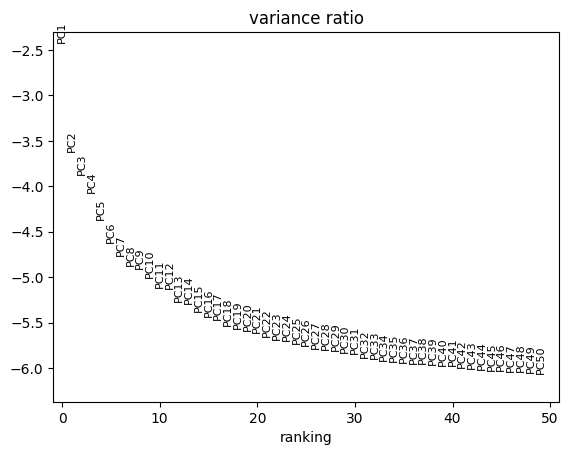

In [15]:
# Run PCA
sc.pp.pca(adata)

# Visualize scree plot
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [16]:
## Construct the nearest neighbor graph for UMAP
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=25)

## Run UMAP
sc.tl.umap(adata)

/Users/dkotliar/mambaforge/envs/starcat/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [17]:
# Merge usages and scores with cell metadata
adata.obs = pd.merge(left=adata.obs, right=usage, how='left', left_index=True, right_index=True)

# Modify object type to string for plotting in scanpy
scores[scores.columns[scores.columns.str.contains('_binary')]] = scores[scores.columns[scores.columns.str.contains('_binary')]].astype('str')
adata.obs = pd.merge(left=adata.obs, right=scores, how='left', left_index=True, right_index=True)

First we plot the discrete features output by starCAT

/Users/dkotliar/mambaforge/envs/starcat/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


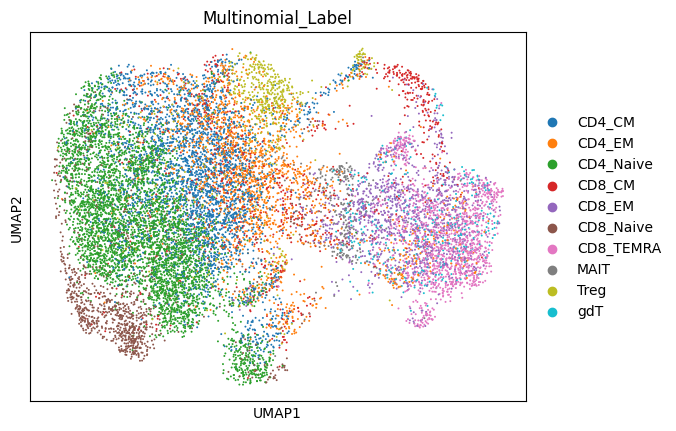

/Users/dkotliar/mambaforge/envs/starcat/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/dkotliar/mambaforge/envs/starcat/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


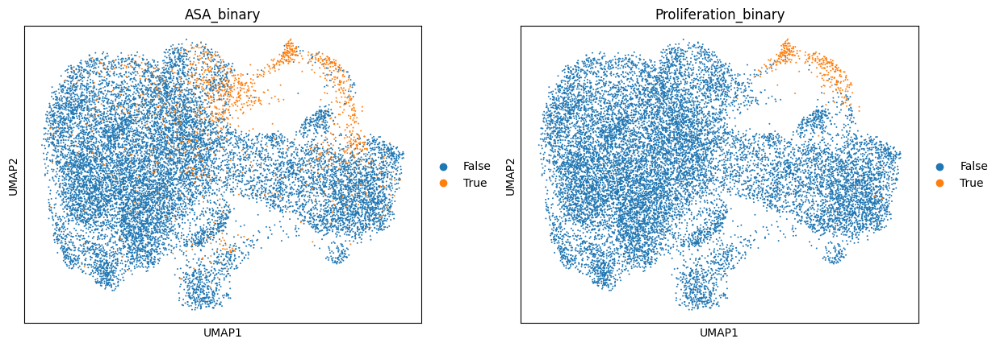

In [18]:
sc.pl.umap(adata, color='Multinomial_Label')
sc.pl.umap(adata, color=['ASA_binary', 'Proliferation_binary'])

As well as continuous scores

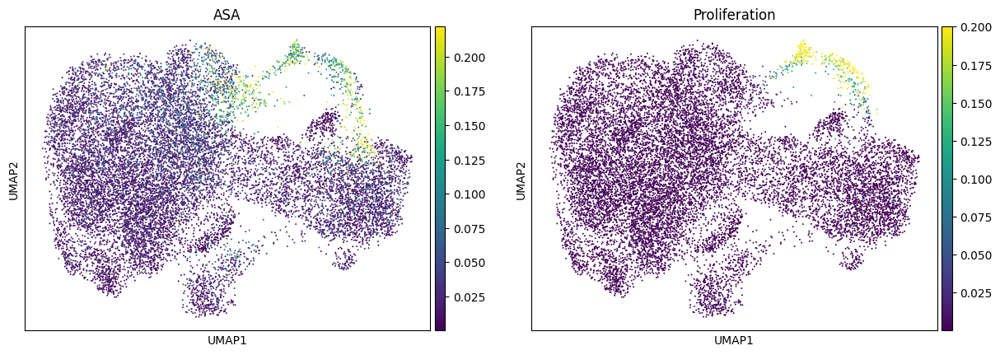

In [19]:
sc.pl.umap(adata, color=['ASA', 'Proliferation'], vmax='p99')

And we can output the continuous usages of all of the cGEPs

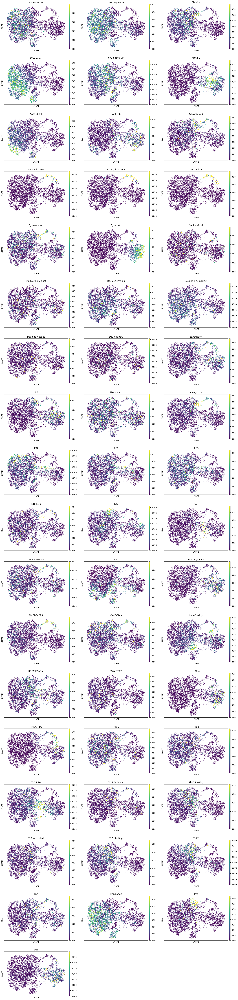

In [20]:
sc.pl.umap(adata, color=sorted(usage.columns), ncols=3, vmin=0, vmax='p99')

# Creating a custom starCAT reference using cNMF results

In order to build a custom starCAT reference, first run cNMF on the reference dataset. Then, load cNMF results to starCAT.

In [21]:
ref_dir = '/data/srlab1/mcurtis/GSK/tcell_proliferation/Hao_20220817/cnmf_output/'
ref_name = 'T_learnHarmonyRNA_RefitBoth'
k = 36
density_threshold = 0.2

In [22]:
cat_obj = starCAT()

Using reference from starCAT database
Loading reference from existing cache file for reference TCAT.V1


In [ ]:
cat_obj.build_reference(ref_dir, ref_name, k, density_threshold)

In [ ]:
# View default reference spectra (genes x programs)
print(cat_obj.ref_name)
display(cat_obj.ref.iloc[:5, :5])

starCAT can be immediately run with the new reference spectra. However, after building reference once, the path to the saved reference can be loaded in future initializations of the starCAT object, i.e. 

```cat_obj = starCAT(reference = 'reference_path')```

In [ ]:
adata = cat_obj.load_counts(datafn)
usage, _ = cat_obj.fit_transform(adata)

In [ ]:
# View default reference spectra (genes x programs)
print(cat_obj.ref_name)
display(cat_obj.ref.iloc[:5, :5])

In [ ]:
usage.head(2)

By default, pre-built reference spectra and scores files are cached, and specifying score path is not necessary. If score add-ons for custom references are desired, pass a filepath to the custom scores.yaml file during initialization of the *CAT object.

Please refer to example references (ex. TCAT.V1) for formatting of the scores file and related files. The scores file should be a yaml file defining relevant weighted linear combinations of GEPs in defining a score (ex. 3 GEPs summed to define Cell Cycle score). It also may include may include code blocks for other types of calculations of scores. Any files referenced by the scores file should be present within the same directory.

An example file structure for TCAT.V1:

```
--TCAT.V1
---TCAT.V1.reference.tsv
---TCAT.V1.scores.yaml
---TCAT.V1.MultiLogRegression.pkl
---multinomial_lineage_classifier.py
```